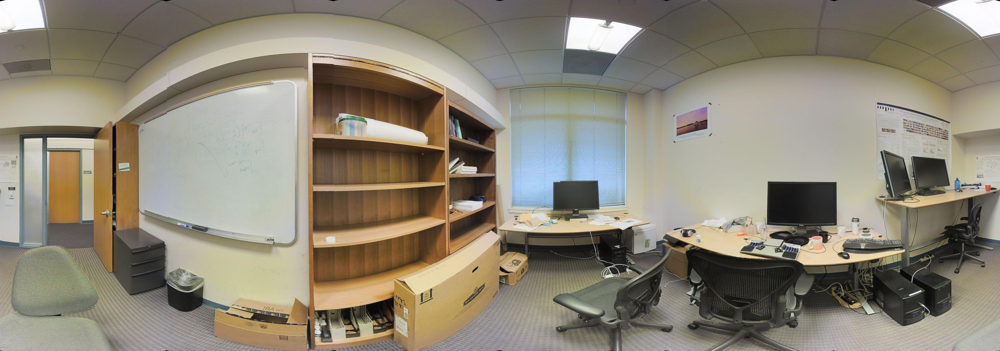

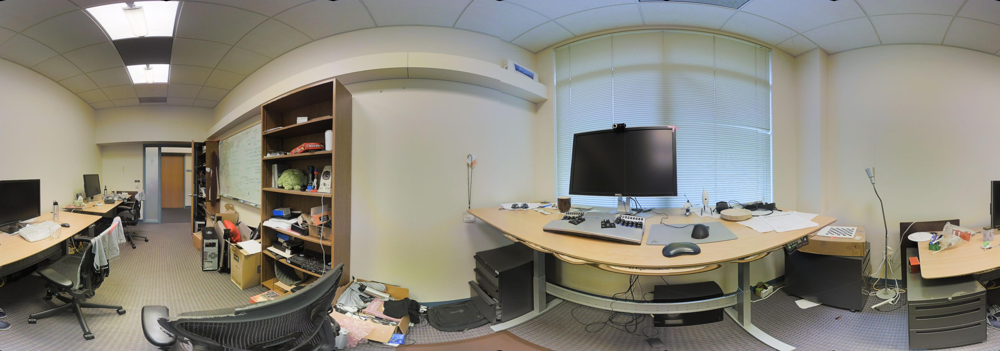

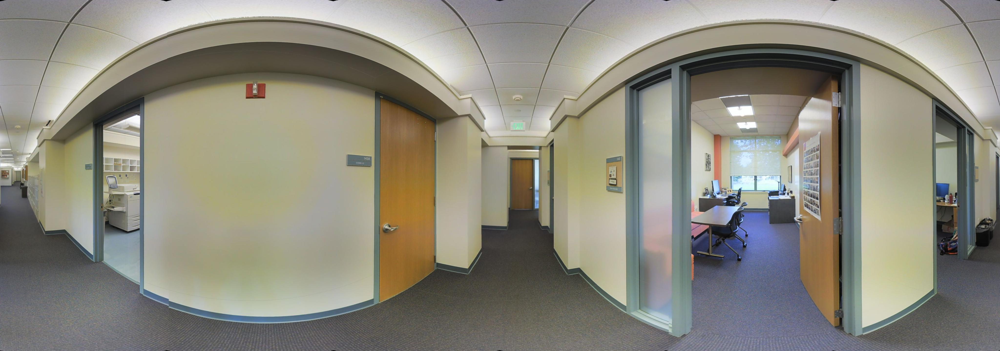

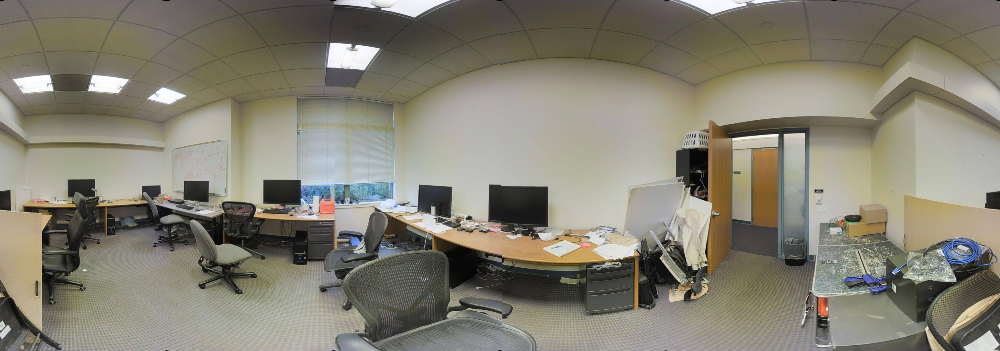

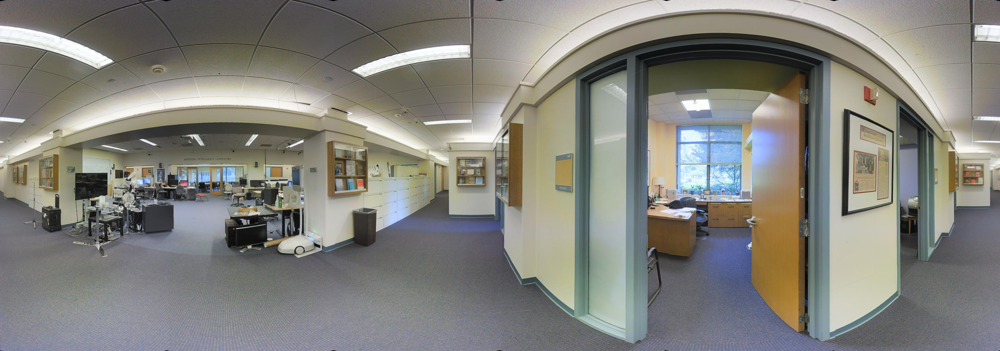

...

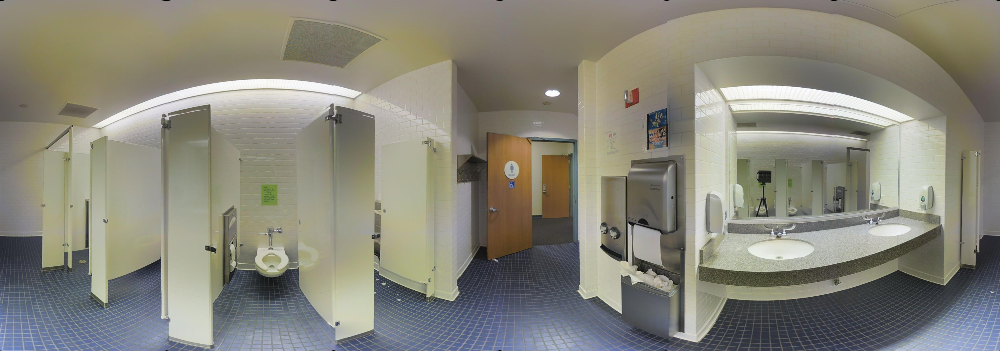

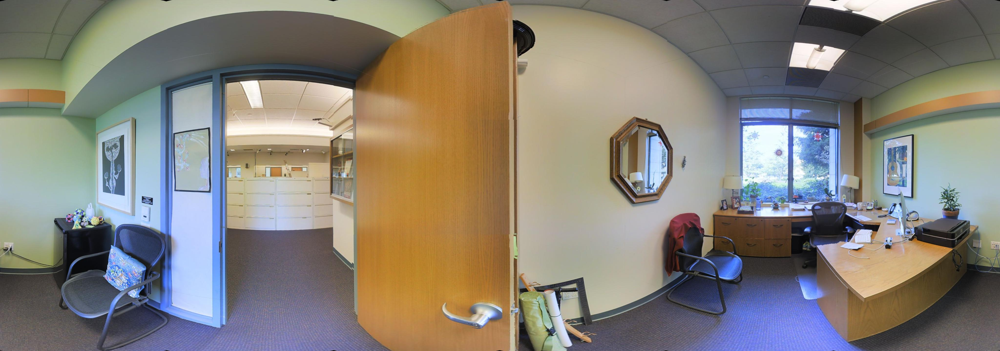

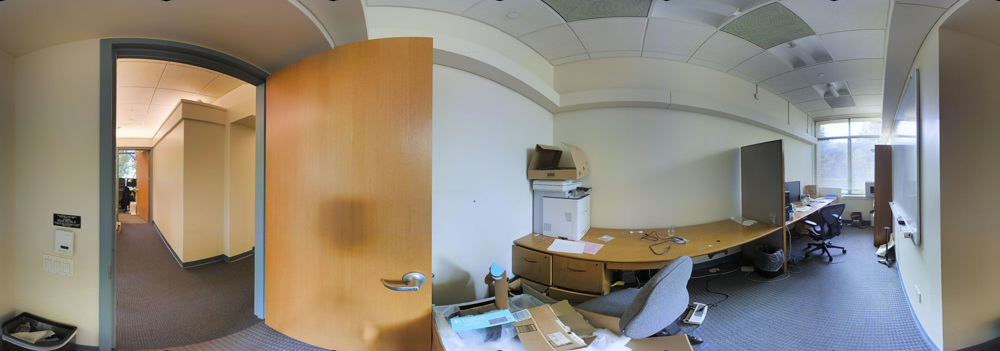

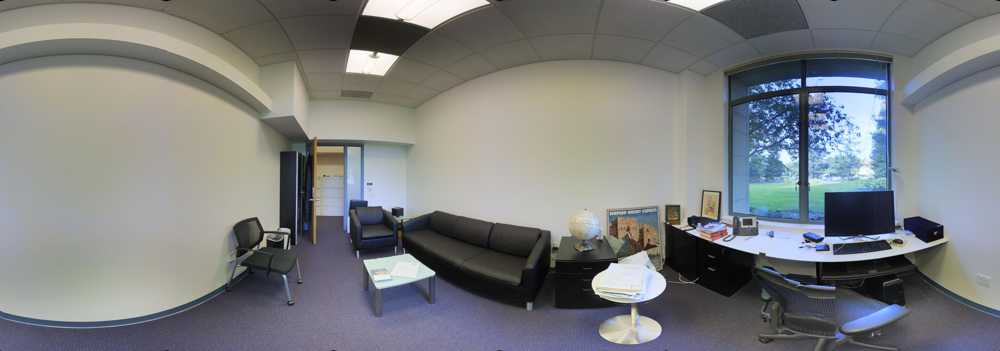

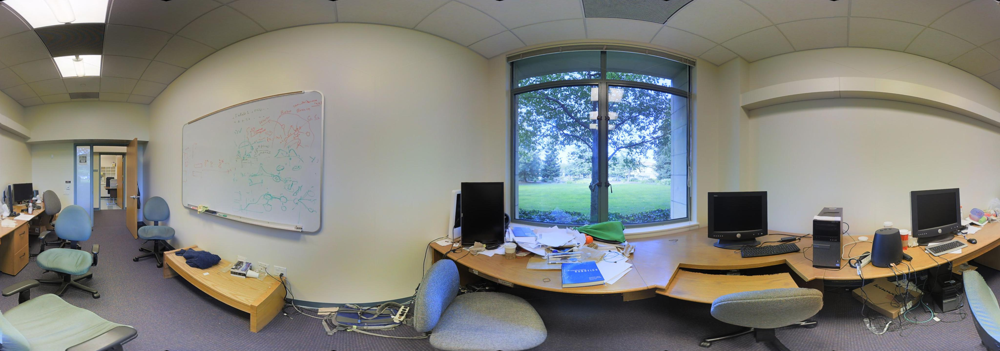

In [2]:
from __future__ import absolute_import, division, print_function, unicode_literals
# from PIL Image
import tensorflow as tf
import numpy as np
import IPython.display as display
tf.enable_eager_execution()

# path to tfrecords
image_dataset_path = tf.data.TFRecordDataset('/Users/manasbhardwaj/Desktop/MasterThesis/code/refactored_final_code/dataset/tfrecord/train-00007-of-00010.tfrecord')

# Create a dictionary describing the features.
image_feature_description = {
      'image/encoded': tf.FixedLenFeature(
          (), tf.string, default_value=''),
      'image/filename': tf.FixedLenFeature(
          (), tf.string, default_value=''),
      'image/format': tf.FixedLenFeature(
          (), tf.string, default_value=''),
      'image/height': tf.FixedLenFeature(
          (), tf.int64, default_value=0),
      'image/width': tf.FixedLenFeature(
          (), tf.int64, default_value=0),
      'image/segmentation/class/encoded': tf.FixedLenFeature(
          (), tf.string, default_value=''),
      'image/segmentation/class/format': tf.FixedLenFeature(
          (), tf.string, default_value='png')
}

def _parse_image(example_proto):
  # Parse the input tf.Example proto using the dictionary above.
  return tf.parse_single_example(example_proto, image_feature_description)

parsed_image = image_dataset_path.map(_parse_image)

for image_features in parsed_image:
  image_raw = image_features['image/encoded'].numpy()
  display.display(display.Image(data=image_raw))